## 3rd Semeseter Assignment
## Action Recognition using Videos using UCF 50 dataset
## Bishal Sarmah
## 23MSD7048

In [ ]:
#importing libraries
import os
import cv2
import math
import random
import numpy as np
import matplotlib.pyplot as plt
from collections import deque
import datetime as dt
import tensorflow as tf
from moviepy.editor import *
%matplotlib inline

from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

  if event.key is 'enter':



In [ ]:
seed_constant = 27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

In [ ]:
#downloading the UCF50 Dataset
!wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF50.rar

#extracting the dataset
!unrar x UCF50.rar

Total number of classes: 50


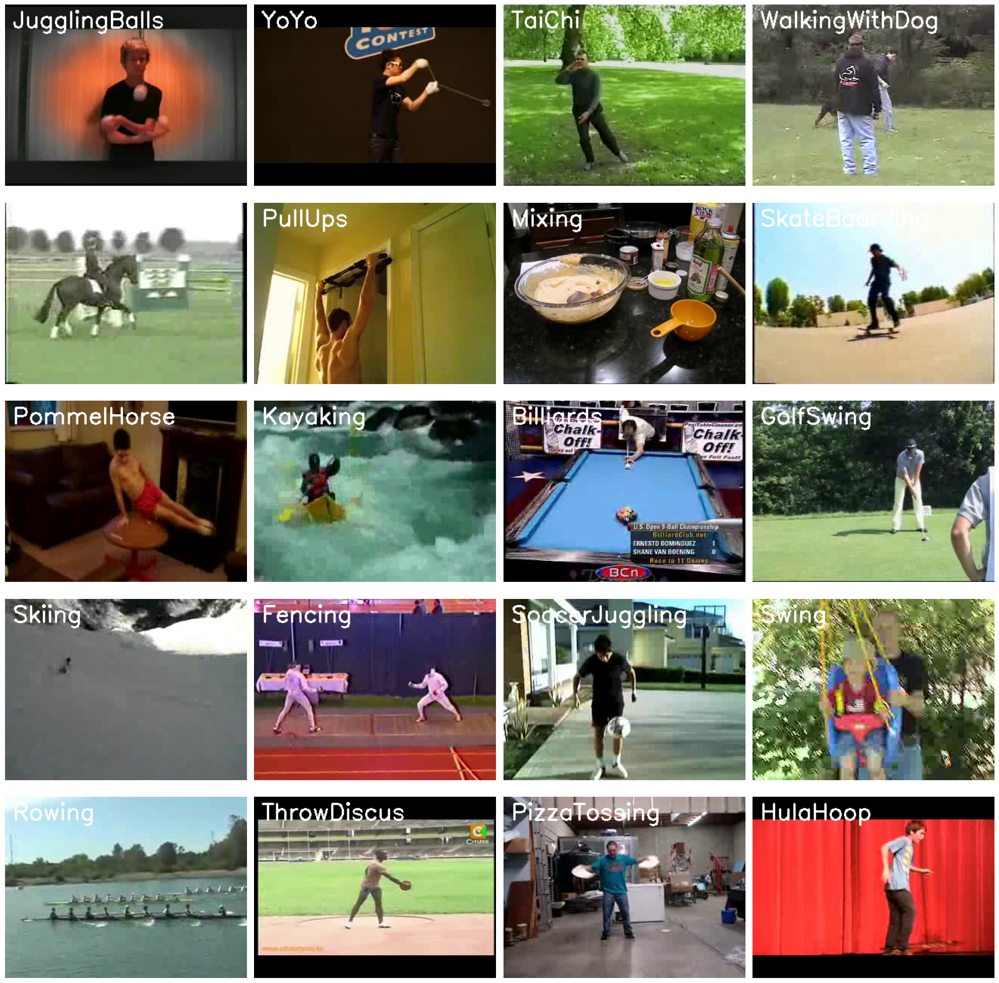

In [ ]:
import os
import cv2
import random
import matplotlib.pyplot as plt

# Set the path to the UCF50 dataset
dataset_path = '/content/UCF50'

# Get the names of all classes/categories in UCF50
all_class_names = os.listdir('/content/UCF50')

#Printing the number of classes available
num_classes = len(all_class_names)
print(f'Total number of classes: {num_classes}')

#Determine the sample size (max 20 or the number of classes available)
sample_size = min(num_classes, 20)

# Create a Matplotlib figure and specify the size of the figure
plt.figure(figsize=(20, 20))

# Generate a list of random indices (class categories)
random_indices = random.sample(range(num_classes), sample_size)

# Iterating through all the generated random indices
for counter, random_index in enumerate(random_indices, start=1):
    # Retrieve a Class Name using the Random Index
    selected_class_name = all_class_names[random_index]

    # Retrieve the list of all the video files present in the randomly selected Class Directory
    video_files_names = os.listdir(os.path.join('/content/UCF50', selected_class_name))

    # Randomly select a video file from the list retrieved from the selected Class Directory
    selected_video_file_name = random.choice(video_files_names)

    # Initialize a VideoCapture object to read from the video file
    video_reader = cv2.VideoCapture(os.path.join('/content/UCF50', selected_class_name, selected_video_file_name))

    # Read the first frame of the video file
    ret, bgr_frame = video_reader.read()

    # Release the VideoCapture object
    video_reader.release()

    if ret:
        # Convert the frame from BGR to RGB format
        rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

        # Write the class name on the video frame
        cv2.putText(rgb_frame, selected_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

        # Display the frame
        plt.subplot(5, 4, counter)
        plt.imshow(rgb_frame)
        plt.axis('off')
    else:
        print(f"Could not read frame from video: {selected_video_file_name}")

# Show the plot with the selected frames
plt.tight_layout()
plt.show()


In [ ]:
# Print the names of all classes/categories in UCF50
print("Classes available in UCF50:")
for class_name in all_class_names:
    print(class_name)


Classes available in UCF50:
BenchPress
JavelinThrow
TrampolineJumping
BreastStroke
Mixing
Nunchucks
RockClimbingIndoor
Diving
HorseRace
RopeClimbing
PlayingViolin
SoccerJuggling
PullUps
SalsaSpin
PlayingTabla
Swing
PommelHorse
WalkingWithDog
HorseRiding
Punch
PlayingGuitar
Billiards
PoleVault
Skiing
TennisSwing
Fencing
PushUps
PlayingPiano
BaseballPitch
JumpingJack
YoYo
ThrowDiscus
JumpRope
HighJump
Kayaking
Drumming
CleanAndJerk
HulaHoop
Lunges
Basketball
Rowing
JugglingBalls
PizzaTossing
SkateBoarding
TaiChi
Biking
Skijet
MilitaryParade
VolleyballSpiking
GolfSwing


In [ ]:
# Print the number of videos in each class
for class_name in all_class_names:
    video_count = len(os.listdir(os.path.join(dataset_path, class_name)))
    print(f'Class: {class_name}, Number of Videos: {video_count}')

Class: BenchPress, Number of Videos: 160
Class: JavelinThrow, Number of Videos: 117
Class: TrampolineJumping, Number of Videos: 119
Class: BreastStroke, Number of Videos: 101
Class: Mixing, Number of Videos: 141
Class: Nunchucks, Number of Videos: 150
Class: RockClimbingIndoor, Number of Videos: 148
Class: Diving, Number of Videos: 153
Class: HorseRace, Number of Videos: 127
Class: RopeClimbing, Number of Videos: 130
Class: PlayingViolin, Number of Videos: 100
Class: SoccerJuggling, Number of Videos: 156
Class: PullUps, Number of Videos: 120
Class: SalsaSpin, Number of Videos: 133
Class: PlayingTabla, Number of Videos: 124
Class: Swing, Number of Videos: 137
Class: PommelHorse, Number of Videos: 123
Class: WalkingWithDog, Number of Videos: 123
Class: HorseRiding, Number of Videos: 197
Class: Punch, Number of Videos: 160
Class: PlayingGuitar, Number of Videos: 160
Class: Billiards, Number of Videos: 150
Class: PoleVault, Number of Videos: 160
Class: Skiing, Number of Videos: 144
Class: 

## Preprocessing

In [ ]:
IMAGE_HEIGHT, IMAGE_WIDTH = 64, 64    #fixing height and width of the image
SEQUENCE_LENGTH = 20                  #number of frames it will take 20 from the videos
DATASET_DIR = '/content/UCF50'
CLASSES_LIST = ['Drumming', 'Basketball', 'Diving','Fencing']     #In these classes we are goint to train our model

In [ ]:
#creating a function to extract, Resize And Normalize the frames

In [ ]:
 def frames_extraction(video_path):
    # Declaring a list to store video frames
    frames_list = []

    #Reading the video file using the VideoCapture object
    video_reader = cv2.VideoCapture(video_path)

    #checking total number of frames in the video
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    #Calculating the interval after which frames will be added to the list
    skip_frames_window = max(int(video_frames_count / SEQUENCE_LENGTH), 1) #here every alternate frame upto 20 are considered for training

    #Iterating through the video frames
    for frame_counter in range(SEQUENCE_LENGTH):
        #current frame position of the video
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        #Reading the frame from the video
        success, frame = video_reader.read()

        #Check if the video frame was not successfully read, then break the loop
        if not success:   #for the last frame
            break

        #Resize the frame to the fixed height and width
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))   #64*64

        #Normalizing the resized frame by dividing by 255 so that each pixel value lies between 0 and 1
        normalized_frame = resized_frame / 255

        #Appending the normalized frame to the frames list
        frames_list.append(normalized_frame)

    video_reader.release()

    return frames_list


In [ ]:
def create_dataset():
    #Declaring empty lists to store the features, labels, and video paths
    temp_features = []
    labels = []
    video_files_path = []

    #Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(CLASSES_LIST):
        # Display the name of the class whose data is being extracted
        print(f'Extracting Data of Class: {class_name}')

        #Getting the list of video files present in the specific class name directory
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))

        #Iterating through all the files present in the files list
        for file_name in files_list:
            #video path
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)

            #Extracting the frames of the video file
            frames = frames_extraction(video_file_path)

            #Checking if the extracted frames are equal to the sequence length specified above
            if len(frames) == SEQUENCE_LENGTH:
                # Append the frames to the temporary list
                temp_features.append(frames)

                # Append the class index number to the label list
                labels.append(class_index)

                # Append the video file path to the video paths list
                video_files_path.append(video_file_path)

    # Converting the lists to numpy arrays
    features = np.asarray(temp_features)
    labels = np.array(labels)

    #Returning the frames, class index, and video file paths
    return features, labels, video_files_path

#Creating the dataset
features, labels, video_files_path = create_dataset()


Extracting Data of Class: Drumming
Extracting Data of Class: Basketball
Extracting Data of Class: Diving
Extracting Data of Class: Fencing


### now we will convert labels (class indexes) into one-hot encoded vectors.

In [ ]:
one_hot_encode_labels = to_categorical(labels)

### Train test split

In [ ]:
# 75% for train and 25% for test
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encode_labels, test_size = 0.25, shuffle = True, random_state = seed_constant)

### Implementing the convolution + LSTM Approach

In [ ]:
def create_convlstm_model():
    model = Sequential()

    model.add(ConvLSTM2D(filters = 4, kernel_size=(3,3), activation = 'tanh', data_format = 'channels_last', recurrent_dropout = 0.2, return_sequences = True, input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = 8, kernel_size=(3,3), activation = 'tanh', data_format = 'channels_last', recurrent_dropout = 0.2, return_sequences = True))
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = 14, kernel_size=(3,3), activation = 'tanh', data_format = 'channels_last', recurrent_dropout = 0.2, return_sequences = True))
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))

    model.add(Flatten())
    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))

    model.summary()

    return model

In [ ]:
#now well utilize the function create_convlstm_model()

In [ ]:
convlstm_model = create_convlstm_model()

  super().__init__(**kwargs)



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv_lstm2d (ConvLSTM2D)             │ (None, 20, 62, 62, 4)       │           1,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 20, 62, 62, 4)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_1 (ConvLSTM2D)           │ (None, 20, 60, 60, 8)       │           3,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d (MaxPooling3D)         │ (None, 20, 30, 30, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_1 (TimeDistributed) │ (None, 20, 30, 30, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_2 (ConvLSTM2D)           │ (None, 20, 28, 28, 14)      │          11,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_1 (MaxPooling3D)       │ (None, 20, 14, 14, 14)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 54880)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 4)                   │         219,524 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 235,180 (918.67 KB)

 Trainable params: 235,180 (918.67 KB)

 Non-trainable params: 0 (0.00 B)

### checking model structure:

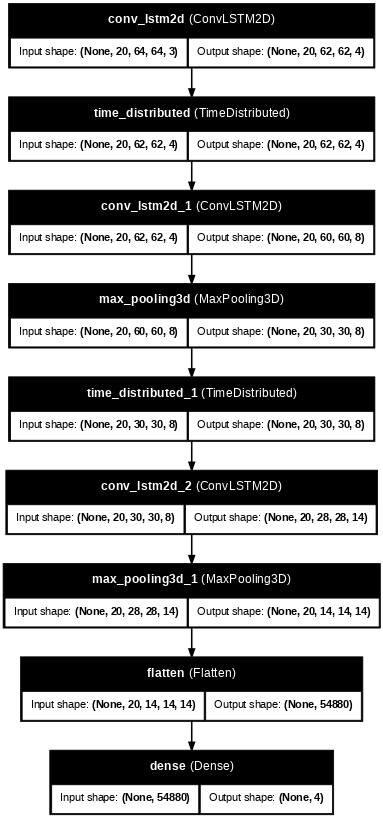

In [ ]:
plot_model(convlstm_model, to_file = 'convlstm_model_structure_plot.png', show_shapes = True, show_layer_names = True, dpi = 56)

### training the model

In [ ]:
#create an Instance of Early Stopping Callback
early_stooping_callback = EarlyStopping(monitor = 'val_loss', patience = 10, mode = 'min', restore_best_weights = True)

#compile the model and specify loss function, learning rate and metrics values to the model
convlstm_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

#train the model
convlstm_model_training_history = convlstm_model.fit(x = features_train, y = labels_train, epochs = 10, batch_size = 4, shuffle = True, validation_split = 0.2, callbacks = [early_stooping_callback])

Epoch 1/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - accuracy: 0.3753 - loss: 1.2928 - val_accuracy: 0.8118 - val_loss: 0.5934
Epoch 2/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step - accuracy: 0.8046 - loss: 0.5869 - val_accuracy: 0.9059 - val_loss: 0.3668
Epoch 3/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - accuracy: 0.9011 - loss: 0.3023 - val_accuracy: 0.8588 - val_loss: 0.4126
Epoch 4/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9242 - loss: 0.2079 - val_accuracy: 0.8941 - val_loss: 0.4340
Epoch 5/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step - accuracy: 0.9554 - loss: 0.1217 - val_accuracy: 0.8941 - val_loss: 0.3796
Epoch 6/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step - accuracy: 0.9451 - loss: 0.1670 - val_accuracy: 0.9059 - val_loss: 0.3553
Epoch 7/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - accuracy: 0.9754 - loss: 0.0806 - val_accuracy: 0.9059 - val_loss: 0.3403
Epoch 8/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - accuracy: 0.9858 - loss: 0.0531 - val_accuracy: 0.8941 

In [ ]:
#Evaluation of the trained model on test data

In [ ]:
model_evaluation_history = convlstm_model.evaluate(features_test, labels_test)

5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 413ms/step - accuracy: 0.9217 - loss: 0.3562


### Test Accuracy coming out as 92.17%

### saving the model

In [ ]:
# Get the loss and accuracy from model_evaluation_history.
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history

date_time_format = '%Y_%m_%d'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)

# Define a useful name for our model to make it easy for us while navigating through multiple saved models.
model_file_name = f'convlstm_model_Date_Time_{current_date_time_string}_Loss_{model_evaluation_loss}_Accuracy_{model_evaluation_accuracy}.h5'

#Saving the Model.
h=convlstm_model.save(model_file_name)

### ploting model's loss and accuracy curves

In [ ]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
# metric_1 = name of the first metric
#metric_2 = name of the second metric
  #getting metric values using metric names as identifiers.
  metric_value_1 = model_training_history.history[metric_name_1]
  metric_value_2 = model_training_history.history[metric_name_2]

  #constructing a range of object which will be used as x-axis of the graph
  epochs = range(len(metric_value_1))

  #ploting the graph
  plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
  plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)

  #adding title to the plot
  plt.title(str(plot_name))

  #adding legend to the plot
  plt.legend()

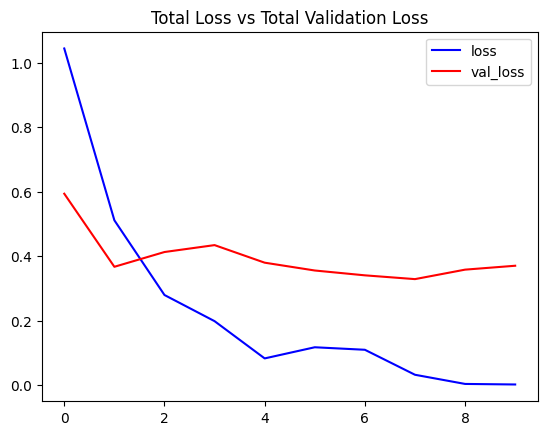

In [ ]:
#visulazing the training and validation loss metrices
plot_metric(convlstm_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

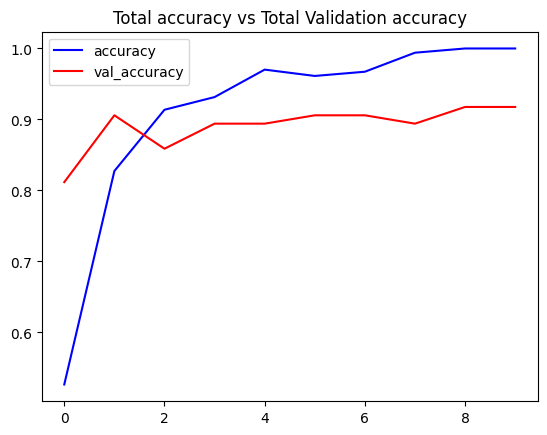

In [ ]:
plot_metric(convlstm_model_training_history, 'accuracy', 'val_accuracy','Total accuracy vs Total Validation accuracy')

### Testing on test data

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model

# Load the trained model (assuming it's saved as 'convlstm_model.h5')
model = load_model('/content/drive/MyDrive/convlstm_model_Date_Time_2024_11_03_Loss_0.3736525774002075_Accuracy_0.914893627166748.h5')

# Function to preprocess a video and extract frames
def preprocess_video(video_path, sequence_length, image_height, image_width):
    cap = cv2.VideoCapture(video_path)
    frames = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Resize the frame to the desired dimensions
        frame = cv2.resize(frame, (image_width, image_height))
        frame = frame / 255.0  # Normalize pixel values

        frames.append(frame)

        # Stop if we have enough frames
        if len(frames) == sequence_length:
            break

    cap.release()

    # Convert frames to numpy array and add batch dimension
    frames_array = np.array(frames)
    frames_array = frames_array[np.newaxis, ...]  # Shape: (1, SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)
    return frames_array

# Path to the test video
video_path = '/content/UCF50/Basketball/v_Basketball_g16_c04.avi'

# Preprocess the video
input_data = preprocess_video(video_path, SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH)

# Make a prediction
predictions = model.predict(input_data)

# Interpret the prediction
predicted_class = np.argmax(predictions, axis=1)
predicted_label = CLASSES_LIST[predicted_class[0]]  # Assuming you have a list of class names

print(f'The predicted action is: {predicted_label}')


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
The predicted action is: Basketball


### Accurately classifying the class of the test video

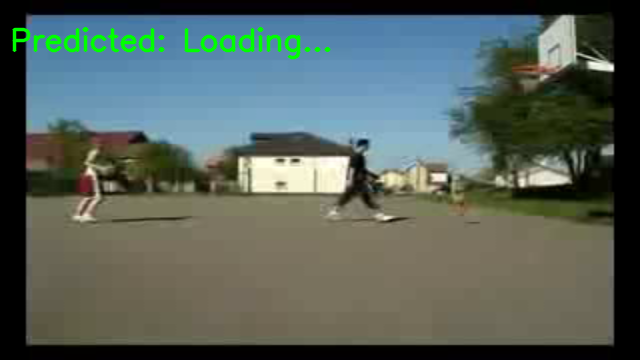

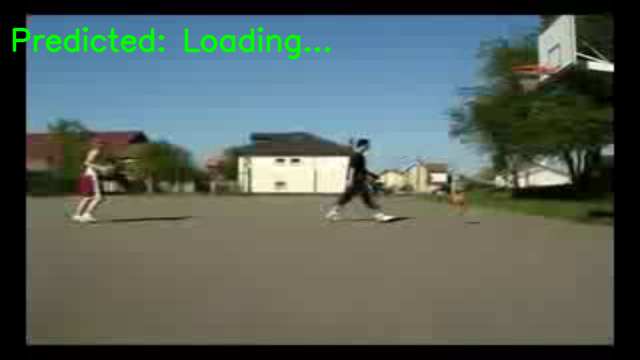

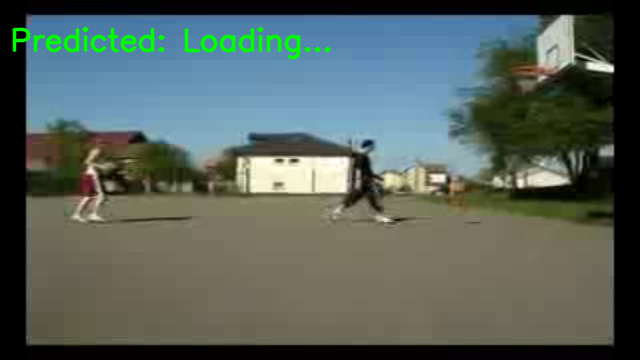

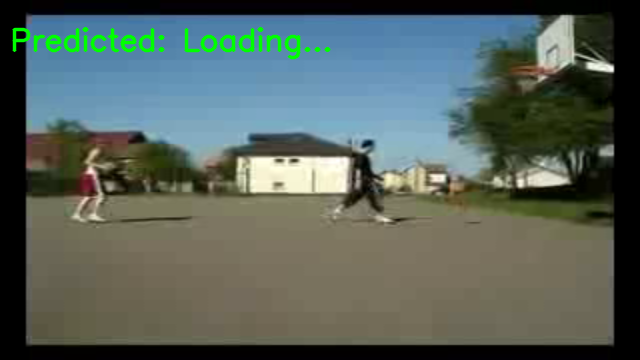

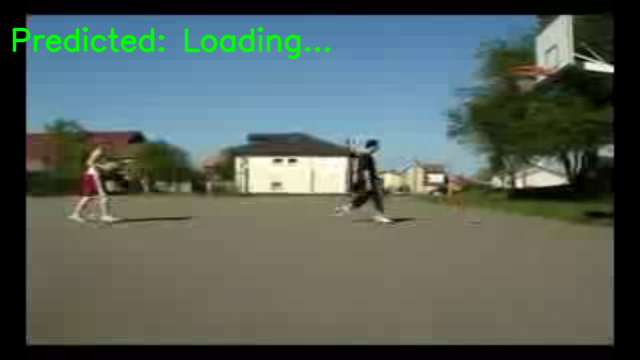

...

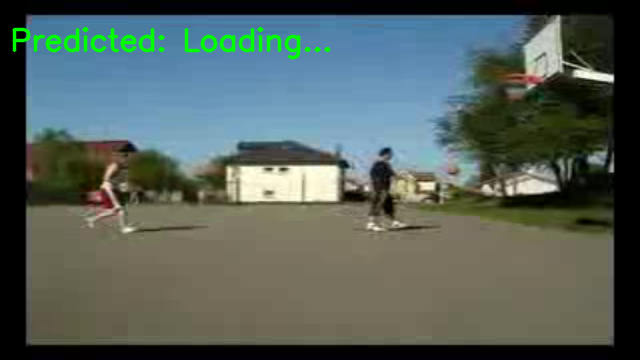

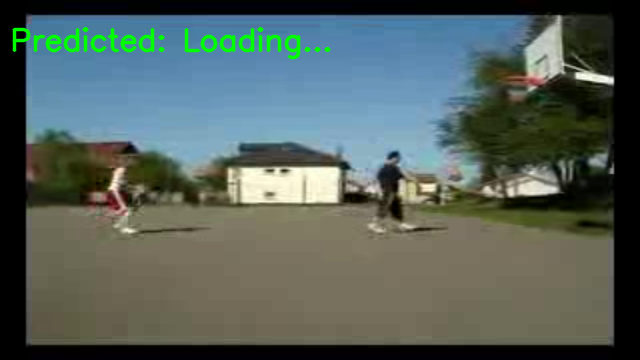

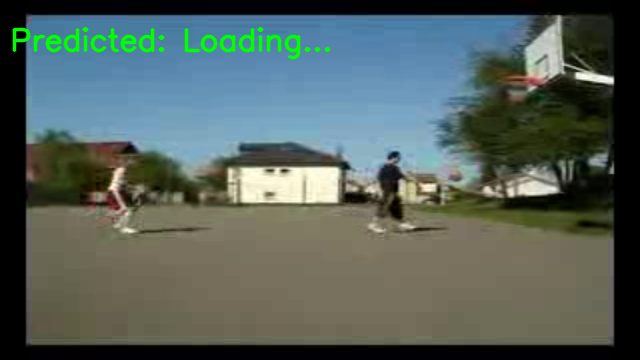

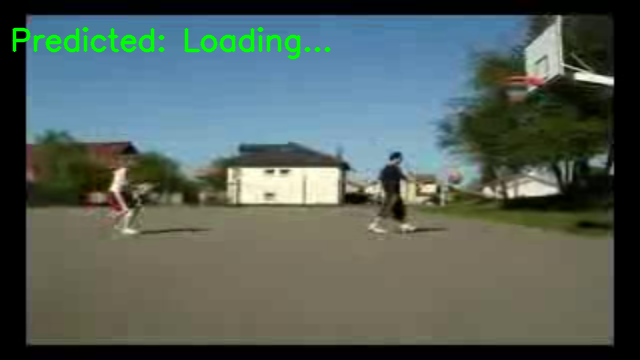

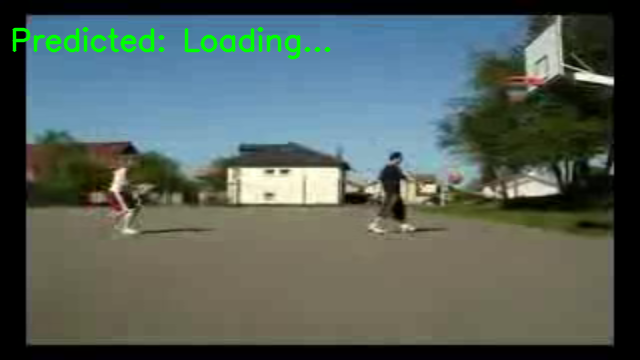

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


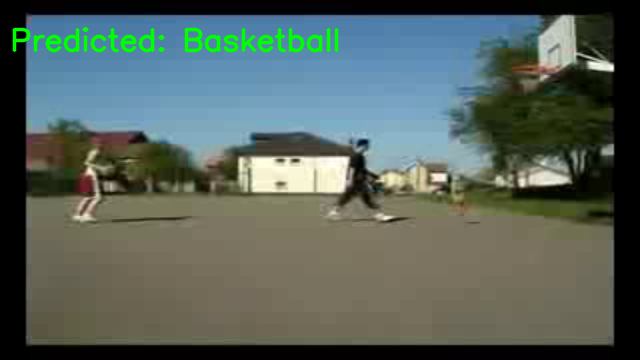

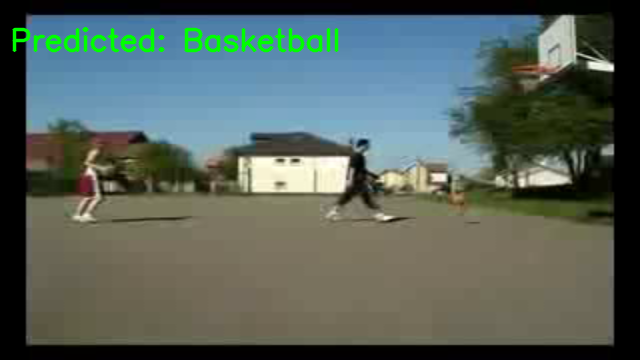

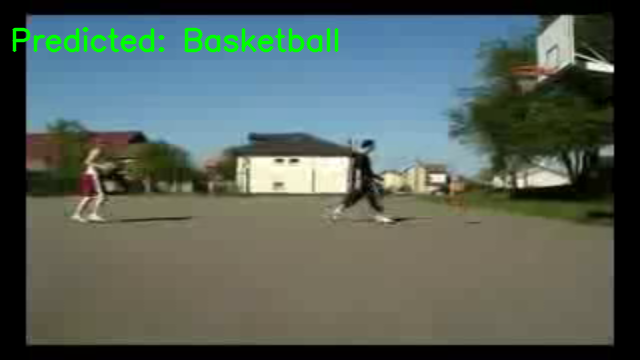

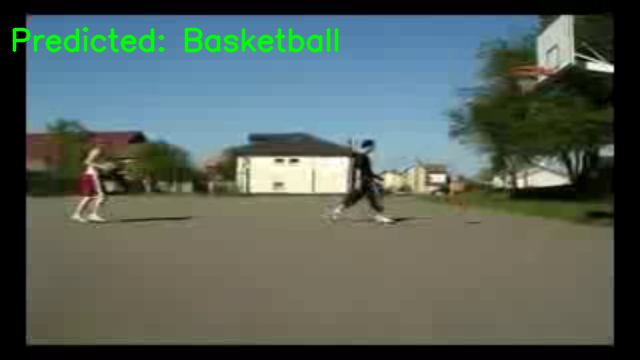

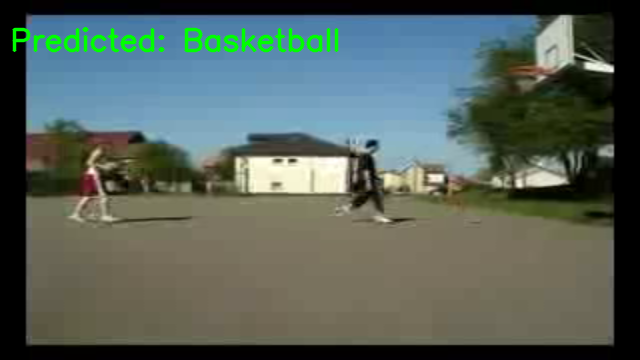

...

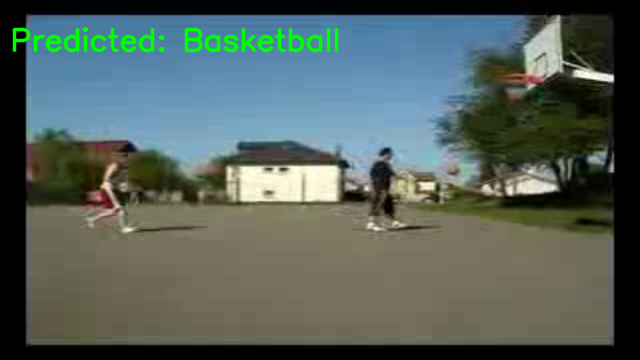

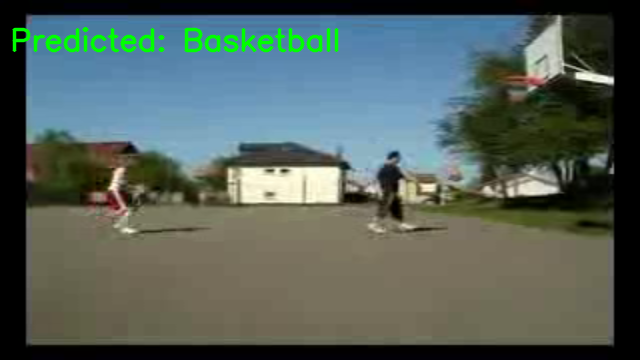

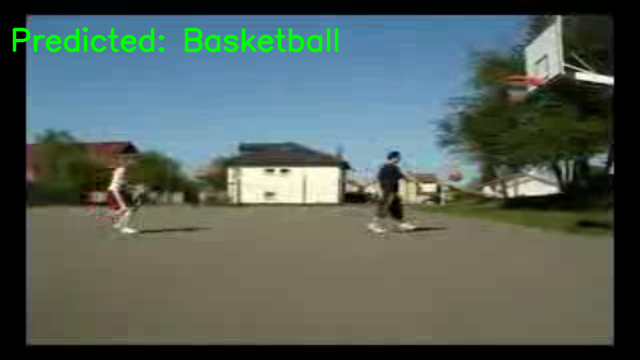

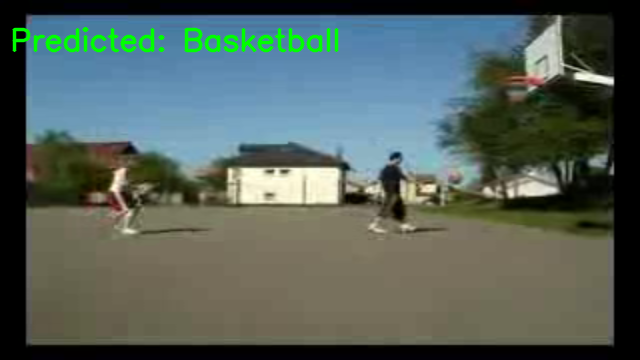

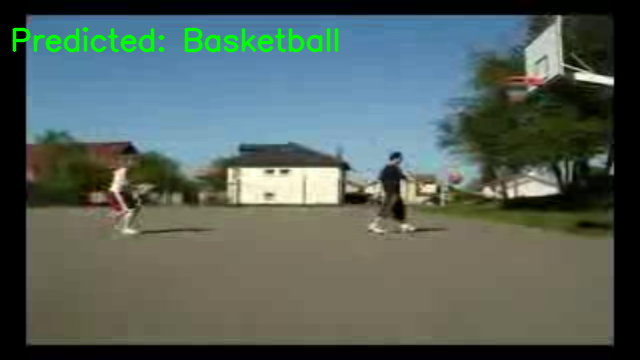

array([[[[[0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ],
          ...,
          [0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ]],

         [[0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ],
          ...,
          [0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ]],

         [[0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ],
          ...,
          [0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        ]],

         ...,

         [[0.        , 0.        , 0.        ],
          [0.        ,

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from tensorflow.keras.models import load_model

# Load the trained model
model = load_model('/content/drive/MyDrive/convlstm_model_Date_Time_2024_11_03_Loss_0.3736525774002075_Accuracy_0.914893627166748.h5')

# Function to preprocess a video and extract frames
def preprocess_video_with_overlay(video_path, sequence_length, image_height, image_width, predicted_label):
    cap = cv2.VideoCapture(video_path)
    frames = []
    output_frames = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Resize and normalize frame for input
        resized_frame = cv2.resize(frame, (image_width, image_height))
        resized_frame = resized_frame / 255.0
        frames.append(resized_frame)

        # Add label overlay to the original frame for visualization
        original_frame = cv2.resize(frame, (640, 360))  # Resize for display purposes
        cv2.putText(original_frame, f'Predicted: {predicted_label}', (10, 50),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv2.LINE_AA)
        output_frames.append(original_frame)

        if len(frames) == sequence_length:
            break

    cap.release()

    # Display the video with the overlay
    for output_frame in output_frames:
        cv2_imshow(output_frame)

    return np.array(frames)[np.newaxis, ...]  # Return preprocessed frames for prediction if needed

# Path to the test video
video_path = '/content/UCF50/Basketball/v_Basketball_g04_c02.avi'

# Preprocess and overlay predicted label
input_data = preprocess_video_with_overlay(video_path, SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 'Loading...')

# Make a prediction and update the video display
predictions = model.predict(input_data)
predicted_class = np.argmax(predictions, axis=1)
predicted_label = CLASSES_LIST[predicted_class[0]]

# Display the video with the final predicted label
preprocess_video_with_overlay(video_path, SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, predicted_label)
